In [135]:
import pickle
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns
from scipy import ndimage
from PIL import Image
import pandas as pd

In [2]:
with open('images_ref.pickle', 'rb') as file:
    images_ref = pickle.load(file)

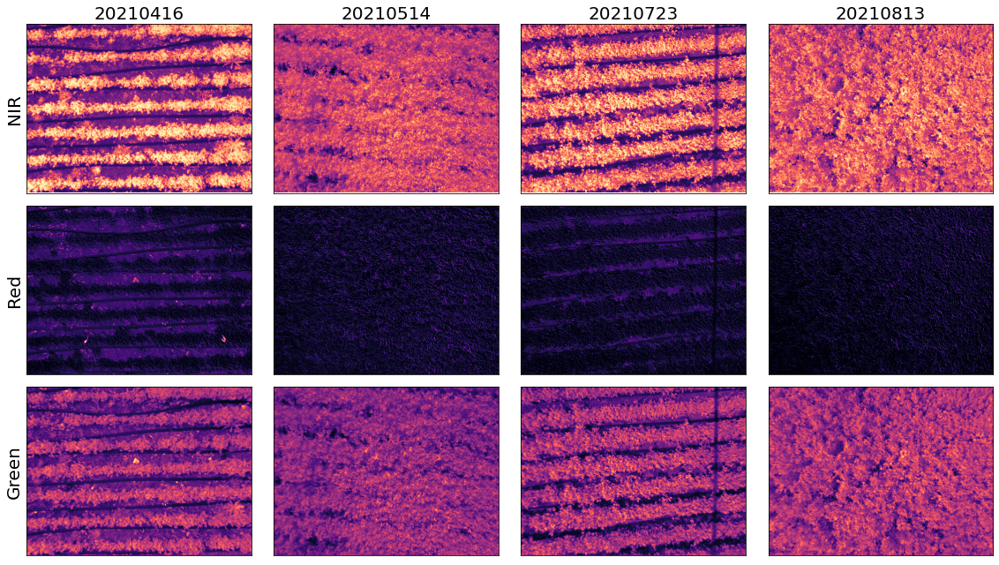

In [3]:
fig, ax = plt.subplots(3, 4, figsize=(16, 9))
for j, (key, image) in enumerate(images_ref.items()):
    for i, band in enumerate(['NIR', 'Red', 'Green']):
        array = images_ref[key][:,:,i]
        ax[i][j].imshow(array, cmap='magma')
        ax[i][j].set_xticks([]); ax[i][j].set_yticks([])
        if i == 0:
            ax[i][j].set_title(key, fontsize=20)
        if j == 0:
            ax[i][j].set_ylabel(band, fontsize=20)
plt.tight_layout()

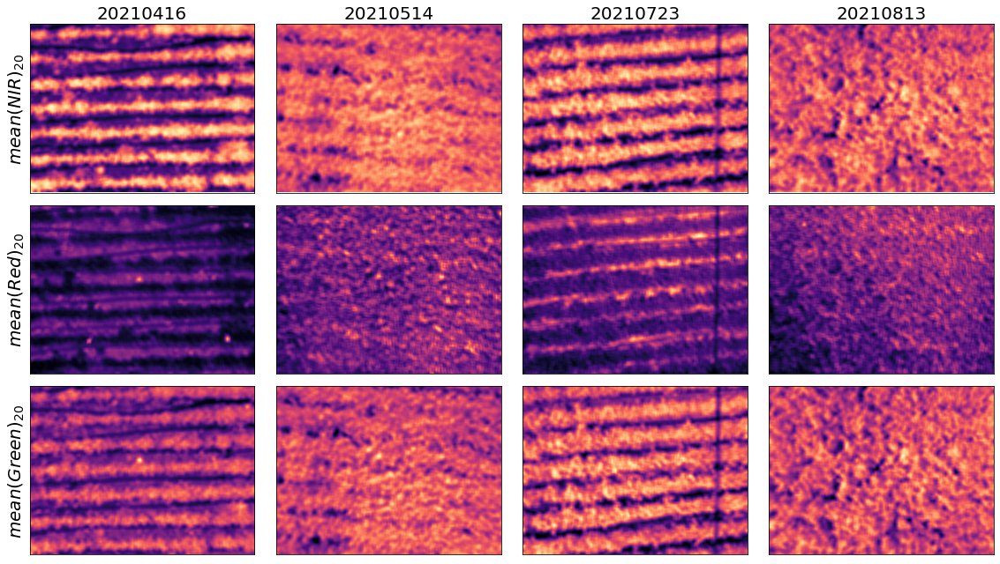

In [4]:
f = lambda x: ndimage.uniform_filter(x, 20)
fig, ax = plt.subplots(3, 4, figsize=(16, 9))
for j, (key, image) in enumerate(images_ref.items()):
    for i, band in enumerate([r'$mean(NIR)_{20}$', r'$mean(Red)_{20}$', r'$mean(Green)_{20}$']):
        array = images_ref[key][:,:,i]
        array = f(array)
        ax[i][j].imshow(array, cmap='magma')
        ax[i][j].set_xticks([]); ax[i][j].set_yticks([])
        if i == 0:
            ax[i][j].set_title(key, fontsize=20)
        if j == 0:
            ax[i][j].set_ylabel(band, fontsize=20)
plt.tight_layout()

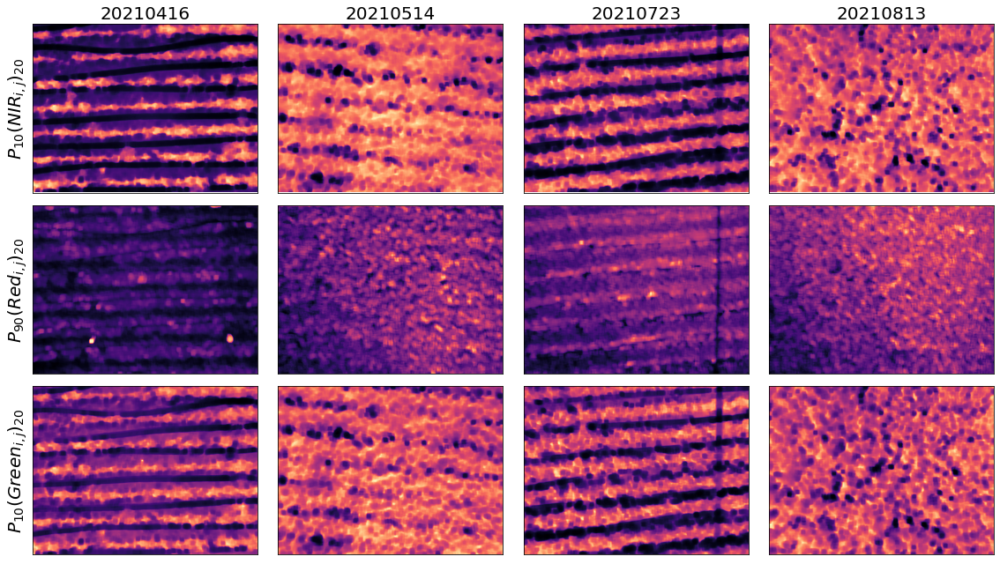

In [5]:
def f(x, band): 
    if 'NIR' in band:
        return ndimage.percentile_filter(x, size=20, percentile=10)
    elif 'Red' in band:
        return ndimage.percentile_filter(x, size=20, percentile=90)
    else:
        return ndimage.percentile_filter(x, size=20, percentile=10)
fig, ax = plt.subplots(3, 4, figsize=(16, 9))
for j, (key, image) in enumerate(images_ref.items()):
    for i, band in enumerate([r'$P_{10}(NIR_{i,j})_{20}$', r'$P_{90}(Red_{i,j})_{20}$', r'$P_{10}(Green_{i,j})_{20}$']):
        array = images_ref[key][:,:,i]
        array = f(array, band)
        ax[i][j].imshow(array, cmap='magma')
        ax[i][j].set_xticks([]); ax[i][j].set_yticks([])
        if i == 0:
            ax[i][j].set_title(key, fontsize=20)
        if j == 0:
            ax[i][j].set_ylabel(band, fontsize=20)
plt.tight_layout()

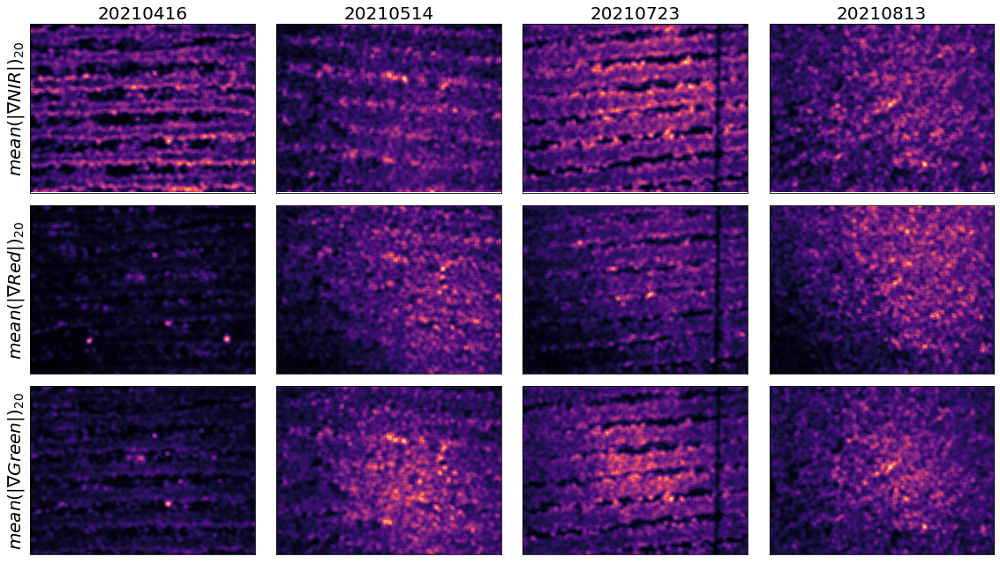

In [6]:
f = lambda x: ndimage.uniform_filter(abs(ndimage.prewitt(x, axis=0)*ndimage.prewitt(x, axis=1)), 20)
fig, ax = plt.subplots(3, 4, figsize=(16, 9))
for j, (key, image) in enumerate(images_ref.items()):
    for i, band in enumerate([r'$mean(|\nabla NIR|)_{20}$', r'$mean(|\nabla Red|)_{20}$', r'$mean(|\nabla Green|)_{20}$']):
        array = images_ref[key][:,:,i]
        array = f(array)
        ax[i][j].imshow(array, cmap='magma')
        ax[i][j].set_xticks([]); ax[i][j].set_yticks([])
        if i == 0:
            ax[i][j].set_title(key, fontsize=20)
        if j == 0:
            ax[i][j].set_ylabel(band, fontsize=20)
plt.tight_layout()

In [7]:
# functions = {
#     'NIR': lambda x: x[:, :, 0],
#     'Red': lambda x: x[:, :, 1],
#     'Green': lambda x: x[:, :, 2],
#     'MeanNIR_ws20': lambda x: ndimage.uniform_filter(x[:, :, 0], 20),
#     'MeanRed_ws20': lambda x: ndimage.uniform_filter(x[:, :, 1], 20),
#     'MeanGreen_ws20': lambda x: ndimage.uniform_filter(x[:, :, 2], 20),
#     'P10NIR_ws20': lambda x: ndimage.percentile_filter(x[:, :, 0], size=20, percentile=10),
#     'P90Red_ws20': lambda x: ndimage.percentile_filter(x[:, :, 1], size=20, percentile=90),
#     'P10Green_ws20': lambda x: ndimage.percentile_filter(x[:, :, 2], size=20, percentile=10),
#     'GradNIR_ws20': lambda x: ndimage.uniform_filter(abs(ndimage.prewitt(x[:, :, 0], axis=0)*ndimage.prewitt(x[:, :, 0], axis=1)), 20),
#     'GradRed_ws20': lambda x: ndimage.uniform_filter(abs(ndimage.prewitt(x[:, :, 1], axis=0)*ndimage.prewitt(x[:, :, 1], axis=1)), 20),
#     'GradGreen_ws20': lambda x: ndimage.uniform_filter(abs(ndimage.prewitt(x[:, :, 2], axis=0)*ndimage.prewitt(x[:, :, 2], axis=1)), 20)
# }

In [8]:
images_ref.keys()

dict_keys(['20210416', '20210514', '20210723', '20210813'])

In [9]:
# features = {}
# for dateKey in images_ref.keys():
#     features[dateKey] = {}
#     print(dateKey)
#     for feature, Function in functions.items():
#         print(feature)
#         features[dateKey][feature] =Function(images_ref[dateKey])
#     mask = np.array(Image.open(f'Segmented/{dateKey}_mask.tiff').getchannel('G').getdata()).reshape(768, 1024)
#     features[dateKey]['target'] = np.where(mask > 0, 1, 0)
#     print()

In [10]:
# for dateKey in features.keys():
#     for featureKey in features[dateKey].keys():
#         features[dateKey][featureKey] = features[dateKey][featureKey].flatten()

In [11]:
# featuresTables = {}
# for Key, data in features.items():
#     featuresTables[Key] = pd.DataFrame(data)
#     featuresTables[Key]['file'] = Key
#     featuresTables[Key]['pixel'] = np.arange(768*1024)

In [12]:
# data = pd.concat([table for table in featuresTables.values()], ignore_index=True)
data = pd.read_pickle('data.pkl')
data

,NIR,Red,Green,MeanNIR_ws20,MeanRed_ws20,MeanGreen_ws20,P10NIR_ws20,P90Red_ws20,P10Green_ws20,GradNIR_ws20,GradRed_ws20,GradGreen_ws20,target,file,pixel
0,0.212389,0.219585,0.398810,0.282419,0.203027,0.356190,0.235988,0.278932,0.303571,0.011103,0.021528,0.011978,0,20210416,0
1,0.247788,0.166172,0.380952,0.282920,0.203264,0.355298,0.235988,0.284866,0.303571,0.011168,0.022294,0.011803,0,20210416,1
2,0.247788,0.166172,0.375000,0.283658,0.201395,0.355952,0.235988,0.284866,0.303571,0.011177,0.022436,0.011804,0,20210416,2
3,0.230088,0.195846,0.351190,0.283304,0.200386,0.355893,0.235988,0.278932,0.303571,0.011905,0.021842,0.011585,0,20210416,3
4,0.271386,0.172107,0.339286,0.282271,0.200356,0.354524,0.235988,0.278932,0.303571,0.012033,0.020845,0.011466,0,20210416,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3145723,0.949686,0.000000,0.449367,0.649025,0.021772,0.389225,0.446541,0.063291,0.284810,0.037652,0.004405,0.007372,1,20210813,786427
3145724,1.000000,0.000000,0.386076,0.660535,0.021915,0.396440,0.459119,0.063291,0.297468,0.038230,0.004719,0.007267,1,20210813,786428
3145725,1.000000,0.000000,0.386076,0.667940,0.023465,0.403101,0.471698,0.069620,0.310127,0.041095,0.005140,0.007453,1,20210813,786429
3145726,1.000000,0.000000,0.417722,0.672186,0.025063,0.408307,0.484277,0.075949,0.322785,0.043251,0.005584,0.007781,1,20210813,786430


In [13]:
# data.to_pickle('data.pkl')

In [14]:
# data_balanced = data.loc[data.target == 0].sample(data.target.value_counts().min())
# data_balanced = pd.concat([data_balanced, data.loc[data.target == 1].sample(data.target.value_counts().min())], ignore_index=True)
# data_balanced = data_balanced.sample(frac=1).reset_index(drop=True)
data_balanced = pd.read_pickle('data_balanced.pkl')

In [15]:
data_balanced

,NIR,Red,Green,MeanNIR_ws20,MeanRed_ws20,MeanGreen_ws20,P10NIR_ws20,P90Red_ws20,P10Green_ws20,GradNIR_ws20,GradRed_ws20,GradGreen_ws20,target,file,pixel
0,0.365782,0.112760,0.238095,0.519676,0.165846,0.428854,0.265487,0.391691,0.261905,0.075543,0.032553,0.038710,0,20210416,701141
1,0.566038,0.012658,0.316456,0.548255,0.036566,0.333544,0.415094,0.094937,0.253165,0.063430,0.012585,0.016902,1,20210813,45395
2,0.647799,0.000000,0.392405,0.620660,0.029810,0.396598,0.509434,0.094937,0.316456,0.026615,0.006894,0.009474,1,20210813,1079
3,0.597484,0.000000,0.462025,0.660016,0.018623,0.380332,0.528302,0.056962,0.297468,0.034948,0.002462,0.008309,1,20210813,778533
4,0.383481,0.148368,0.327381,0.258274,0.147374,0.278006,0.159292,0.231454,0.190476,0.010105,0.009816,0.007940,0,20210416,567898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1776853,0.389381,0.267062,0.345238,0.551416,0.120193,0.433036,0.383481,0.207715,0.351190,0.058604,0.017385,0.016577,0,20210416,701552
1776854,0.742138,0.000000,0.297468,0.621258,0.028465,0.368339,0.471698,0.082278,0.278481,0.035249,0.007563,0.014627,1,20210813,193688
1776855,0.642643,0.089286,0.341317,0.524550,0.039420,0.285269,0.342342,0.107143,0.191617,0.055831,0.009174,0.013887,1,20210514,553966
1776856,0.961652,0.154303,0.714286,0.884366,0.059674,0.578661,0.713864,0.142433,0.446429,0.038494,0.016236,0.032588,1,20210416,617059


In [16]:
# data_balanced.to_pickle('data_balanced.pkl')

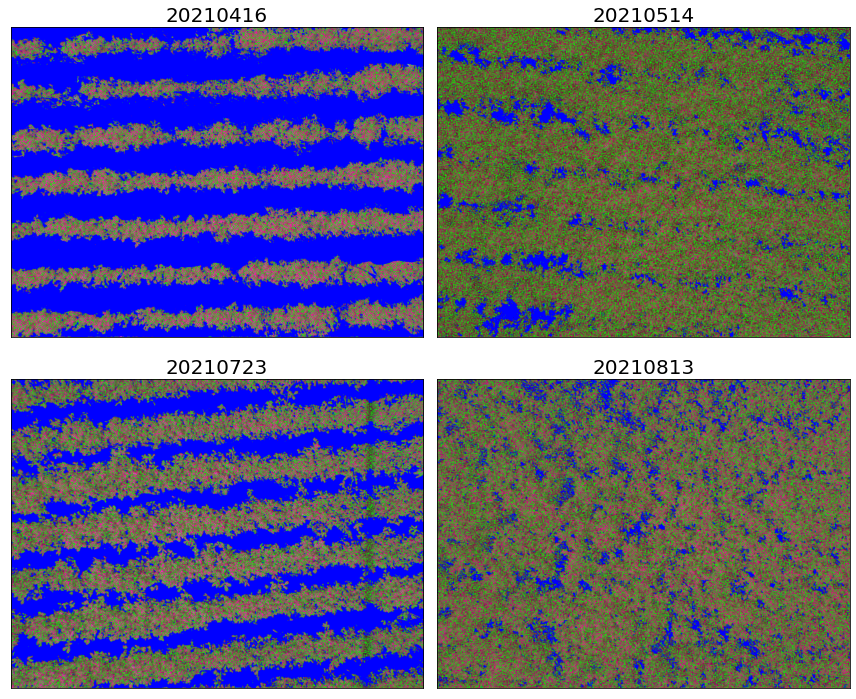

In [17]:
# Draw sample pixels
fig, ax = plt.subplots(2, 2, figsize=(12, 10))
ax = ax.flatten()
for j, (key, image) in enumerate(images_ref.items()):
    array = images_ref[key]
    array_r = array[:, :, 0].flatten()
    array_g = array[:, :, 1].flatten()
    array_b = array[:, :, 2].flatten()
    for pixel in data_balanced.loc[(data_balanced.file == key) & (data_balanced.target == 1), 'pixel']:
        array_r[pixel] = 0; array_g[pixel] = 1; array_b[pixel] = 0
    for pixel in data_balanced.loc[(data_balanced.file == key) & (data_balanced.target == 0), 'pixel']:
        array_r[pixel] = 0; array_g[pixel] = 0; array_b[pixel] = 1
    array[:, :, 0] = array_r.reshape((768, 1024))
    array[:, :, 1] = array_g.reshape((768, 1024))
    array[:, :, 2] = array_b.reshape((768, 1024))
    ax[j].imshow(array)
    ax[j].set_xticks([]); ax[j].set_yticks([])
    ax[j].set_title(key, fontsize=20)
plt.tight_layout()

# Model

### 1. Random Forest

In [18]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
import joblib

In [19]:
# test_data = data_balanced.sample(frac=0.2)
# test_data.to_pickle('test_data.pkl')
# model_data = data_balanced.loc[~data_balanced.index.isin(test_data.index)]
# model_data.to_pickle('model_data.pkl')
test_data = pd.read_pickle('test_data.pkl')
model_data = pd.read_pickle('model_data.pkl')

In [20]:
train_data = model_data.sample(frac=.75)
eval_data = model_data.loc[~model_data.index.isin(train_data.index)]

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.6s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    1.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    1.0s finished


              precision    recall  f1-score   support

           0       0.97      0.95      0.96    533380
           1       0.95      0.97      0.96    532734

    accuracy                           0.96   1066114
   macro avg       0.96      0.96      0.96   1066114
weighted avg       0.96      0.96      0.96   1066114



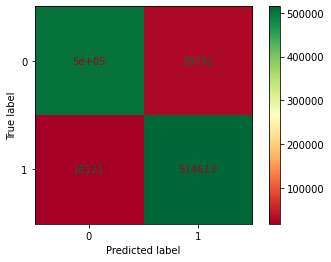

In [21]:
X_train = train_data.to_numpy()[:, :-3].astype(np.float64)
y_train = train_data.to_numpy()[:, -3].astype(int)
X_val = eval_data.to_numpy()[:, :-3].astype(np.float64)
y_val = eval_data.to_numpy()[:, -3].astype(int)
# rf_class = RandomForestClassifier(
#     criterion='entropy',
#     max_depth=5,
#     bootstrap=True,
#     n_jobs=4,
#     verbose=1
# )
# rf_class.fit(X_train, y_train)
rf_class = joblib.load('rf_class.joblib')
metrics.plot_confusion_matrix(rf_class, X_train, y_train, cmap='RdYlGn')
print(metrics.classification_report(y_train, rf_class.predict(X_train)))

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.3s finished


              precision    recall  f1-score   support

           0       0.96      0.95      0.96    177762
           1       0.95      0.97      0.96    177610

    accuracy                           0.96    355372
   macro avg       0.96      0.96      0.96    355372
weighted avg       0.96      0.96      0.96    355372



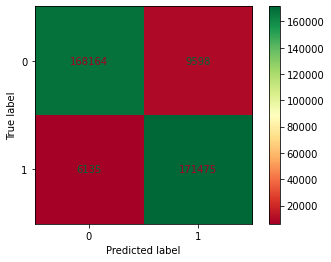

In [22]:
metrics.plot_confusion_matrix(rf_class, X_val, y_val, cmap='RdYlGn')
print(metrics.classification_report(y_val, rf_class.predict(X_val)))

In [224]:
# joblib.dump(rf_class, 'rf_class.joblib')

['rf_class.joblib']

Text(0, 0.5, 'Importance')

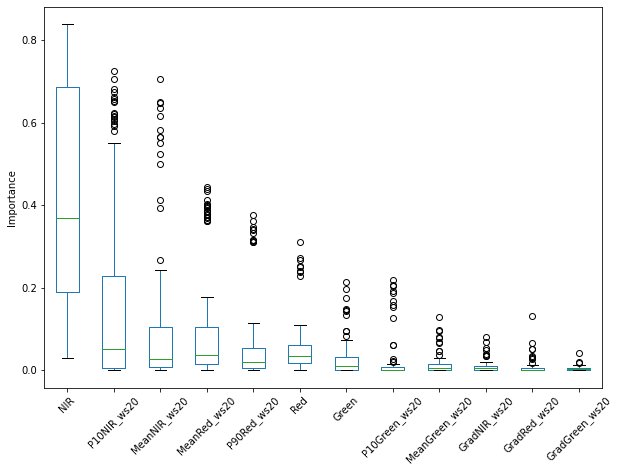

In [23]:
importances = [estimator.feature_importances_ for estimator in rf_class.estimators_]
importances = pd.DataFrame(importances)
importances.columns = train_data.columns[:-3]
importances = importances.loc[:, importances.mean().sort_values(ascending=False).index]
fig, ax = plt.subplots(figsize=(10, 7))
importances.plot(kind='box', ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 45)
ax.set_ylabel('Importance')

#### RF model with feature selection

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.0s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.0s finished


              precision    recall  f1-score   support

           0       0.96      0.95      0.95    533380
           1       0.95      0.96      0.95    532734

    accuracy                           0.95   1066114
   macro avg       0.95      0.95      0.95   1066114
weighted avg       0.95      0.95      0.95   1066114



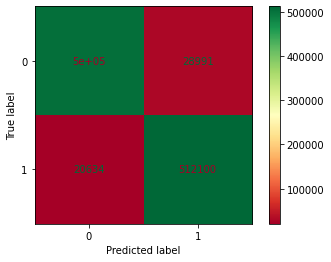

In [24]:
X_train = train_data.loc[
        :, ['NIR', 'P10NIR_ws20', 'MeanNIR_ws20', 'MeanRed_ws20', 'P90Red_ws20', 'Red', 'Green']
    ].to_numpy().astype(np.float64)
y_train = train_data.to_numpy()[:, -3].astype(int)
X_val = eval_data.loc[
        :, ['NIR', 'P10NIR_ws20', 'MeanNIR_ws20', 'MeanRed_ws20', 'P90Red_ws20', 'Red', 'Green']
    ].to_numpy().astype(np.float64)
y_val = eval_data.to_numpy()[:, -3].astype(int)
# rf_class_fs = RandomForestClassifier(
#     criterion='entropy',
#     max_depth=5,
#     bootstrap=True,
#     n_jobs=8,
#     verbose=1
# )
# rf_class_fs.fit(X_train, y_train)
rf_class_fs = joblib.load('rf_class_fs.joblib')
metrics.plot_confusion_matrix(rf_class_fs, X_train, y_train, cmap='RdYlGn')
print(metrics.classification_report(y_train, rf_class_fs.predict(X_train)))

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.3s finished


              precision    recall  f1-score   support

           0       0.96      0.95      0.95    177762
           1       0.95      0.96      0.95    177610

    accuracy                           0.95    355372
   macro avg       0.95      0.95      0.95    355372
weighted avg       0.95      0.95      0.95    355372



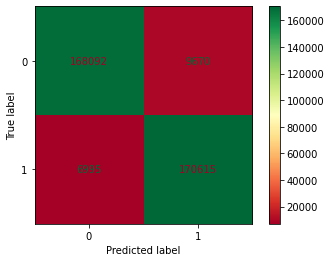

In [25]:
metrics.plot_confusion_matrix(rf_class_fs, X_val, y_val, cmap='RdYlGn')
print(metrics.classification_report(y_val, rf_class_fs.predict(X_val)))

In [26]:
# joblib.dump(rf_class_fs, 'rf_class_fs.joblib')

Text(0, 0.5, 'Importance')

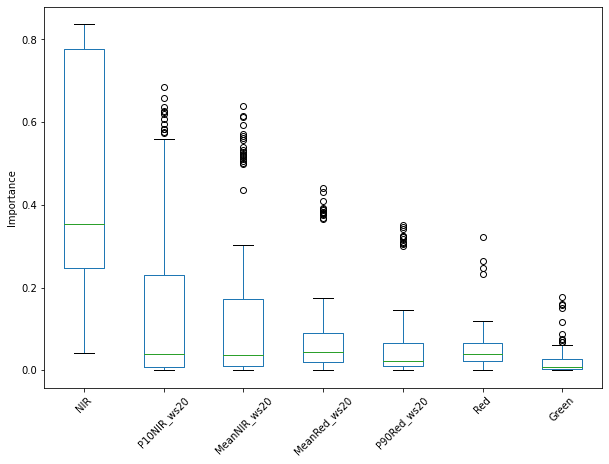

In [27]:
importances = [estimator.feature_importances_ for estimator in rf_class_fs.estimators_]
importances = pd.DataFrame(importances)
importances.columns = ['NIR', 'P10NIR_ws20', 'MeanNIR_ws20', 'MeanRed_ws20', 'P90Red_ws20', 'Red', 'Green']
importances = importances.loc[:, importances.mean().sort_values(ascending=False).index]
fig, ax = plt.subplots(figsize=(10, 7))
importances.plot(kind='box', ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation = 45)
ax.set_ylabel('Importance')

### Logistic Regression

In [28]:
from sklearn.linear_model import LogisticRegression

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   1 out of   1 | elapsed:   16.2s finished


              precision    recall  f1-score   support

           0       0.95      0.94      0.95    533380
           1       0.94      0.95      0.95    532734

    accuracy                           0.95   1066114
   macro avg       0.95      0.95      0.95   1066114
weighted avg       0.95      0.95      0.95   1066114



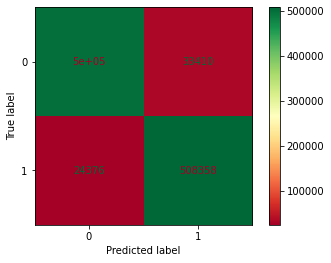

In [29]:
lr_class = LogisticRegression(
    verbose=1, 
    n_jobs=4
)
lr_class.fit(X_train, y_train)
metrics.plot_confusion_matrix(lr_class, X_train, y_train, cmap='RdYlGn')
print(metrics.classification_report(y_train, lr_class.predict(X_train)))

              precision    recall  f1-score   support

           0       0.95      0.94      0.95    177762
           1       0.94      0.95      0.95    177610

    accuracy                           0.95    355372
   macro avg       0.95      0.95      0.95    355372
weighted avg       0.95      0.95      0.95    355372



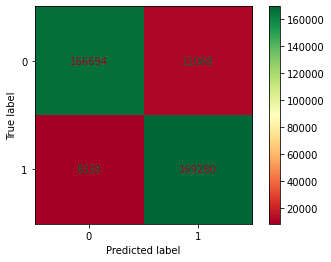

In [30]:
metrics.plot_confusion_matrix(lr_class, X_val, y_val, cmap='RdYlGn')
print(metrics.classification_report(y_val, lr_class.predict(X_val)))

## Testing RF in testing_data

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.3s finished


              precision    recall  f1-score   support

           0       0.96      0.95      0.95    177287
           1       0.95      0.96      0.95    178085

    accuracy                           0.95    355372
   macro avg       0.95      0.95      0.95    355372
weighted avg       0.95      0.95      0.95    355372



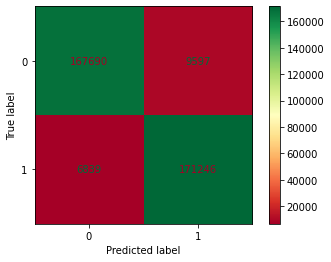

In [31]:
X_test = test_data.loc[
        :, ['NIR', 'P10NIR_ws20', 'MeanNIR_ws20', 'MeanRed_ws20', 'P90Red_ws20', 'Red', 'Green']
    ].to_numpy().astype(np.float64)
y_test = test_data.to_numpy()[:, -3].astype(int)
metrics.plot_confusion_matrix(rf_class_fs, X_test, y_test, cmap='RdYlGn')
print(metrics.classification_report(y_test, rf_class_fs.predict(X_test)))

In [39]:
# Testing with an image

In [40]:
image_test = data.loc[data.file == '20210416']

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.7s finished


              precision    recall  f1-score   support

           0       0.98      0.92      0.95    466759
           1       0.89      0.97      0.93    319673

    accuracy                           0.94    786432
   macro avg       0.93      0.94      0.94    786432
weighted avg       0.94      0.94      0.94    786432



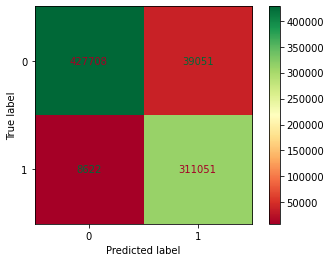

In [42]:
X_image = image_test.loc[
        :, ['NIR', 'P10NIR_ws20', 'MeanNIR_ws20', 'MeanRed_ws20', 'P90Red_ws20', 'Red', 'Green']
    ].to_numpy().astype(np.float64)
y_image = image_test.to_numpy()[:, -3].astype(int)
metrics.plot_confusion_matrix(rf_class_fs, X_image, y_image, cmap='RdYlGn')
print(metrics.classification_report(y_image, rf_class_fs.predict(X_image)))

In [43]:
canopy = rf_class_fs.predict(X_image)

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.8s finished


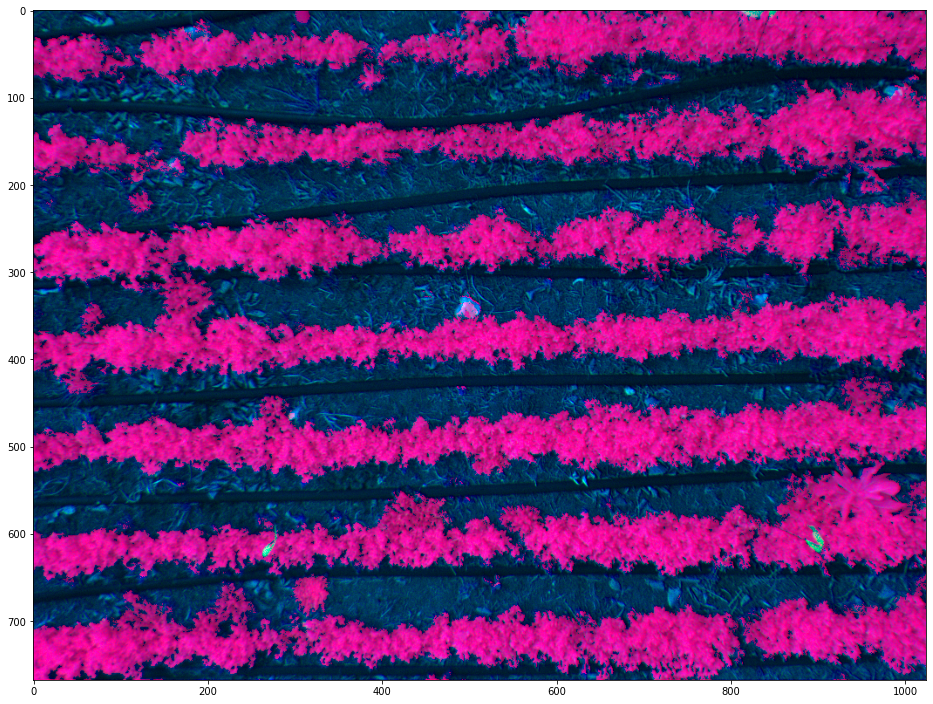

In [58]:
with open('images_ref.pickle', 'rb') as file:
    images_ref = pickle.load(file)
array = images_ref['20210416']
bands = {'r': array[:, :, 0].flatten(), 'g': array[:, :, 1].flatten(), 'b': array[:, :, 2].flatten()}
for n, pixel in enumerate(canopy):
    if pixel == 0:
        bands['r'][n] = 0; bands['g'][n] = 0; bands['b'][n] = 0
array[:, :, 0] = bands['r'].reshape((768, 1024))

fig, ax = plt.subplots(figsize=(16, 16))
ax.imshow(array)

In [60]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

In [66]:
X_train = train_data.to_numpy()[:, :-3].astype(np.float64)
y_train = train_data.to_numpy()[:, -3].astype(int)
X_val = eval_data.to_numpy()[:, :-3].astype(np.float64)
y_val = eval_data.to_numpy()[:, -3].astype(int)

ada_class = AdaBoostClassifier(
    base_estimator=DecisionTreeClassifier(
        criterion='entropy',
        splitter='random',
        max_depth=3
    ),
    n_estimators=50,
)
ada_class.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(criterion='entropy',
                                                         max_depth=3,
                                                         splitter='random'))

              precision    recall  f1-score   support

           0       0.96      0.95      0.96    177762
           1       0.95      0.96      0.96    177610

    accuracy                           0.96    355372
   macro avg       0.96      0.96      0.96    355372
weighted avg       0.96      0.96      0.96    355372



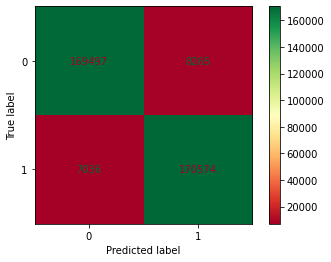

In [67]:
metrics.plot_confusion_matrix(ada_class, X_val, y_val, cmap='RdYlGn')
print(metrics.classification_report(y_val, ada_class.predict(X_val)))

              precision    recall  f1-score   support

           0       0.95      0.94      0.95    466759
           1       0.92      0.93      0.93    319673

    accuracy                           0.94    786432
   macro avg       0.94      0.94      0.94    786432
weighted avg       0.94      0.94      0.94    786432



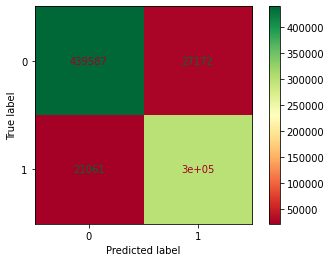

In [68]:
X_image = image_test.to_numpy()[:, :-3].astype(np.float64)
y_image = image_test.to_numpy()[:, -3].astype(int)
metrics.plot_confusion_matrix(ada_class, X_image, y_image, cmap='RdYlGn')
print(metrics.classification_report(y_image, ada_class.predict(X_image)))

In [128]:
mask = np.array(Image.open(f'Segmented/20210416_mask.tiff').getchannel('G').getdata()).reshape(768, 1024)
mask = mask.flatten()
mask = np.where(mask > 0, 1, 0)
canopy = ada_class.predict(X_image)

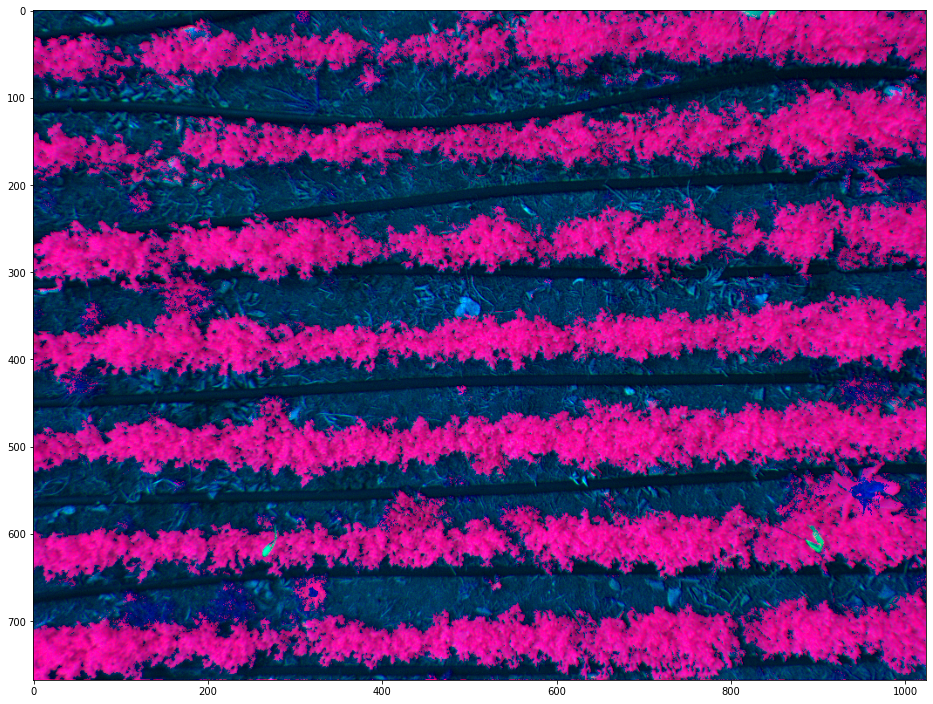

In [129]:
with open('images_ref.pickle', 'rb') as file:
    images_ref = pickle.load(file)
array = images_ref['20210416'][:]
bands = {'r': array[:, :, 0].flatten(), 'g': array[:, :, 1].flatten(), 'b': array[:, :, 2].flatten()}
for n, pixel in enumerate(canopy):
    if pixel == 0 and mask[n] == 0: # True negatives Green
        bands['r'][n] = 0; bands['g'][n] = 0; bands['b'][n] = 0
array[:, :, 0] = bands['r'].reshape((768, 1024))
fig, ax = plt.subplots(figsize=(16, 16))
ax.imshow(array)

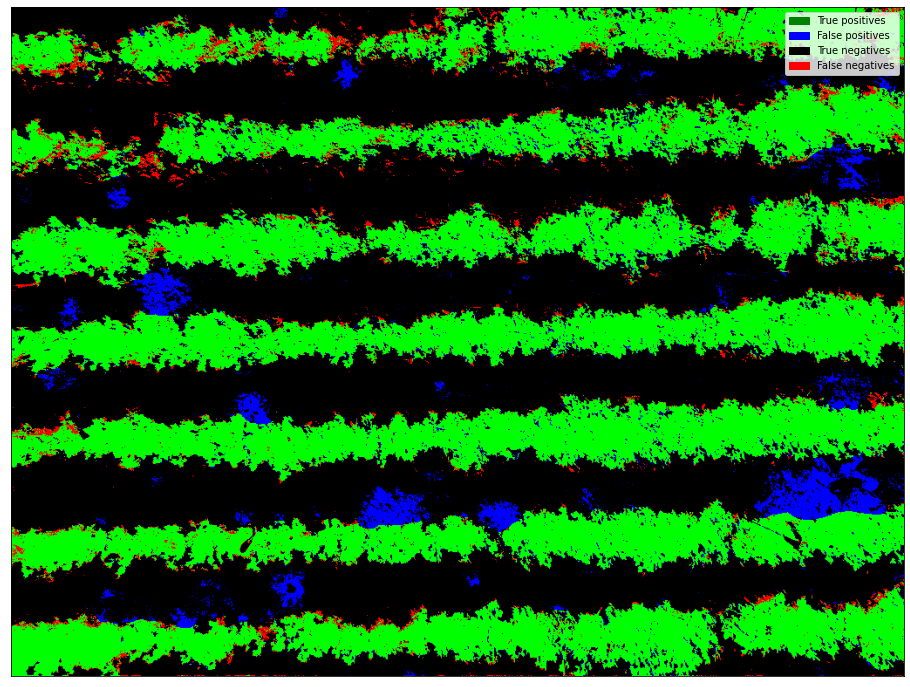

In [136]:
with open('images_ref.pickle', 'rb') as file:
    images_ref = pickle.load(file)
array = images_ref['20210416'][:]
bands = {'r': array[:, :, 0].flatten(), 'g': array[:, :, 1].flatten(), 'b': array[:, :, 2].flatten()}
for n, pixel in enumerate(canopy):
    if pixel == 1 and mask[n] == 1: # True Positives Green
        bands['r'][n] = 0; bands['g'][n] = 1; bands['b'][n] = 0
    elif pixel == 1 and mask[n] == 0: # False Positives Blue
        bands['r'][n] = 0; bands['g'][n] = 0; bands['b'][n] = 1
    elif pixel == 0 and mask[n] == 0: # True Negatives Black
        bands['r'][n] = 0; bands['g'][n] = 0; bands['b'][n] = 0
    else: # False negatives Red
        bands['r'][n] = 1; bands['g'][n] = 0; bands['b'][n] = 0

array[:, :, 0] = bands['r'].reshape((768, 1024))
array[:, :, 1] = bands['g'].reshape((768, 1024))
array[:, :, 2] = bands['b'].reshape((768, 1024))

fig, ax = plt.subplots(figsize=(16, 16))
ax.imshow(array)
ax.set_xticks([]); ax.set_yticks([])
legend_elements = [
    Patch(facecolor='g', edgecolor='g', label='True positives'),
    Patch(facecolor='b', edgecolor='b', label='False positives'),
    Patch(facecolor='k', edgecolor='k', label='True negatives'),
    Patch(facecolor='r', edgecolor='r', label='False negatives')
]
ax.legend(handles=legend_elements)

              precision    recall  f1-score   support

           0       0.79      0.98      0.87     66971
           1       1.00      0.98      0.99    719461

    accuracy                           0.98    786432
   macro avg       0.89      0.98      0.93    786432
weighted avg       0.98      0.98      0.98    786432



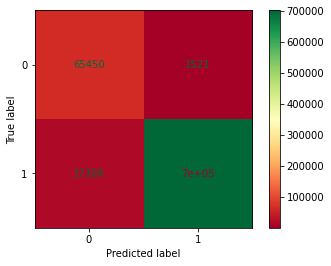

In [141]:
image_test = data.loc[data.file == '20210514']
X_image = image_test.to_numpy()[:,:-3].astype(np.float64)
y_image = image_test.to_numpy()[:, -3].astype(int)
metrics.plot_confusion_matrix(ada_class, X_image, y_image, cmap='RdYlGn')
print(metrics.classification_report(y_image, ada_class.predict(X_image)))

In [142]:
mask = np.array(Image.open(f'Segmented/20210514_mask.tiff').getchannel('G').getdata()).reshape(768, 1024)
mask = mask.flatten()
mask = np.where(mask > 0, 1, 0)
canopy = ada_class.predict(X_image)

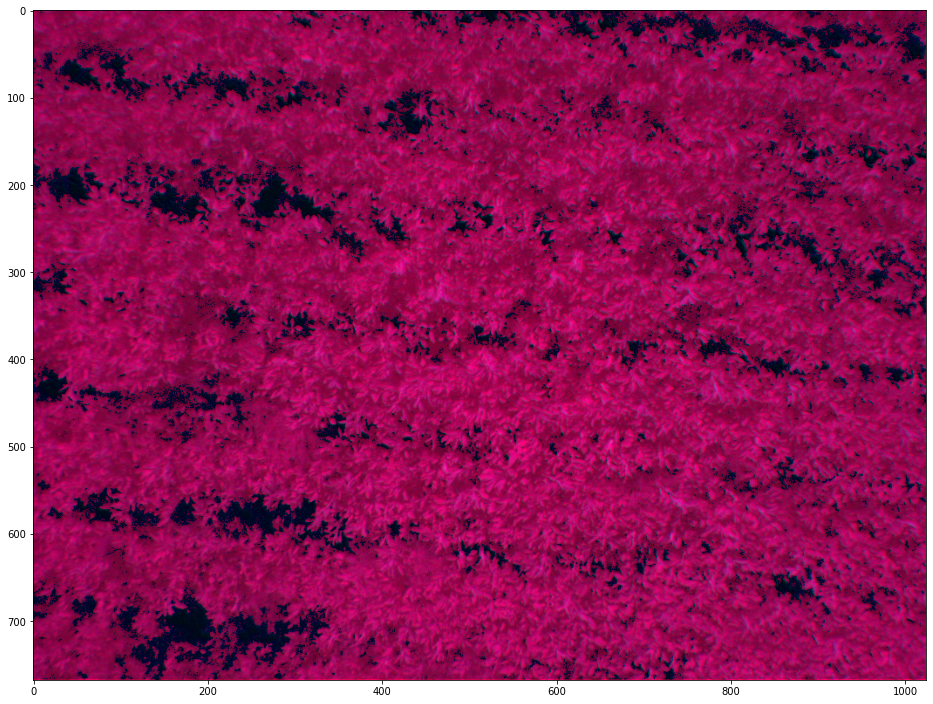

In [143]:
with open('images_ref.pickle', 'rb') as file:
    images_ref = pickle.load(file)
array = images_ref['20210514'][:]
bands = {'r': array[:, :, 0].flatten(), 'g': array[:, :, 1].flatten(), 'b': array[:, :, 2].flatten()}
for n, pixel in enumerate(canopy):
    if pixel == 0 and mask[n] == 0: # True negatives Green
        bands['r'][n] = 0; bands['g'][n] = 0; bands['b'][n] = 0
array[:, :, 0] = bands['r'].reshape((768, 1024))
fig, ax = plt.subplots(figsize=(16, 16))
ax.imshow(array)

In [ ]:
with open('images_ref.pickle', 'rb') as file:
    images_ref = pickle.load(file)
array = images_ref['20210416'][:]
bands = {'r': array[:, :, 0].flatten(), 'g': array[:, :, 1].flatten(), 'b': array[:, :, 2].flatten()}
for n, pixel in enumerate(canopy):
    if pixel == 1 and mask[n] == 1: # True Positives Green
        bands['r'][n] = 0; bands['g'][n] = 1; bands['b'][n] = 0
    elif pixel == 1 and mask[n] == 0: # False Positives Blue
        bands['r'][n] = 0; bands['g'][n] = 0; bands['b'][n] = 1
    elif pixel == 0 and mask[n] == 0: # True Negatives Black
        bands['r'][n] = 0; bands['g'][n] = 0; bands['b'][n] = 0
    else: # False negatives Red
        bands['r'][n] = 1; bands['g'][n] = 0; bands['b'][n] = 0

array[:, :, 0] = bands['r'].reshape((768, 1024))
array[:, :, 1] = bands['g'].reshape((768, 1024))
array[:, :, 2] = bands['b'].reshape((768, 1024))

fig, ax = plt.subplots(figsize=(16, 16))
ax.imshow(array)
ax.set_xticks([]); ax.set_yticks([])
legend_elements = [
    Patch(facecolor='g', edgecolor='g', label='True positives'),
    Patch(facecolor='b', edgecolor='b', label='False positives'),
    Patch(facecolor='k', edgecolor='k', label='True negatives'),
    Patch(facecolor='r', edgecolor='r', label='False negatives')
]
ax.legend(handles=legend_elements)